# Apriori

## Teoria

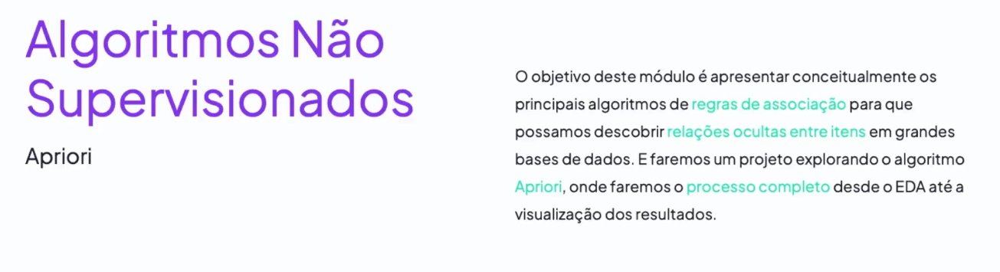

### O que são regras de associação?

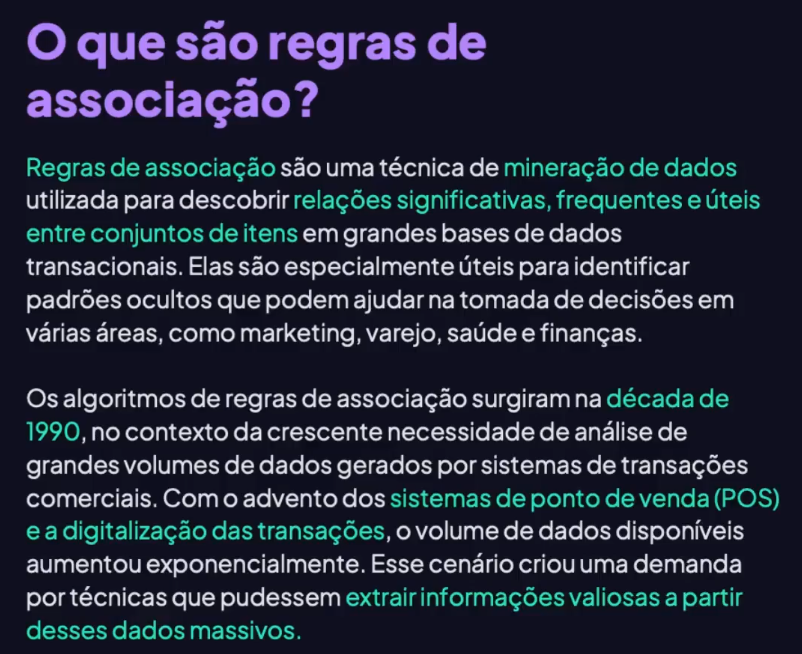

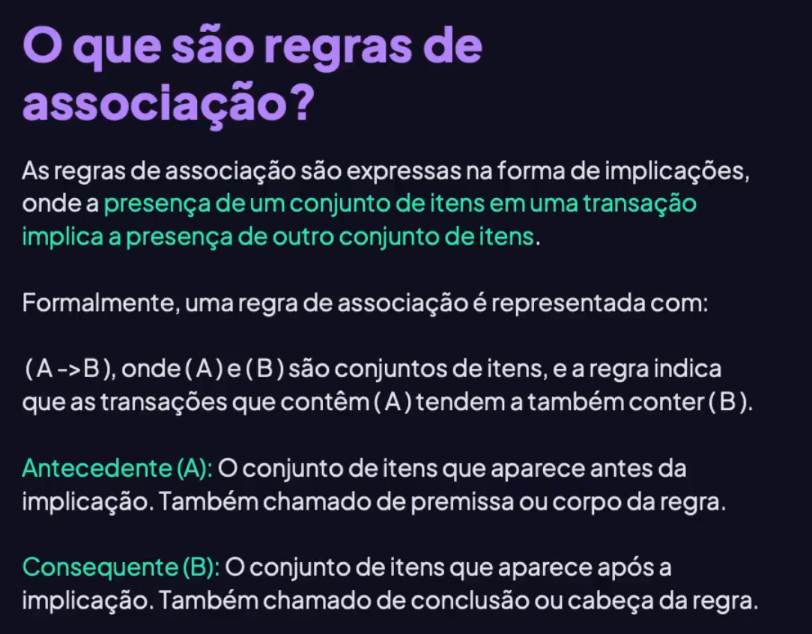

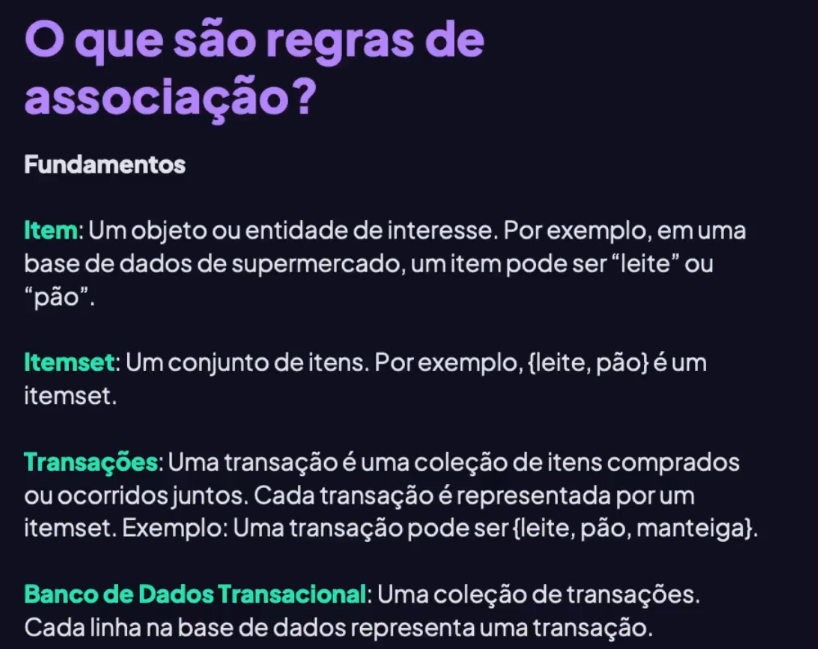

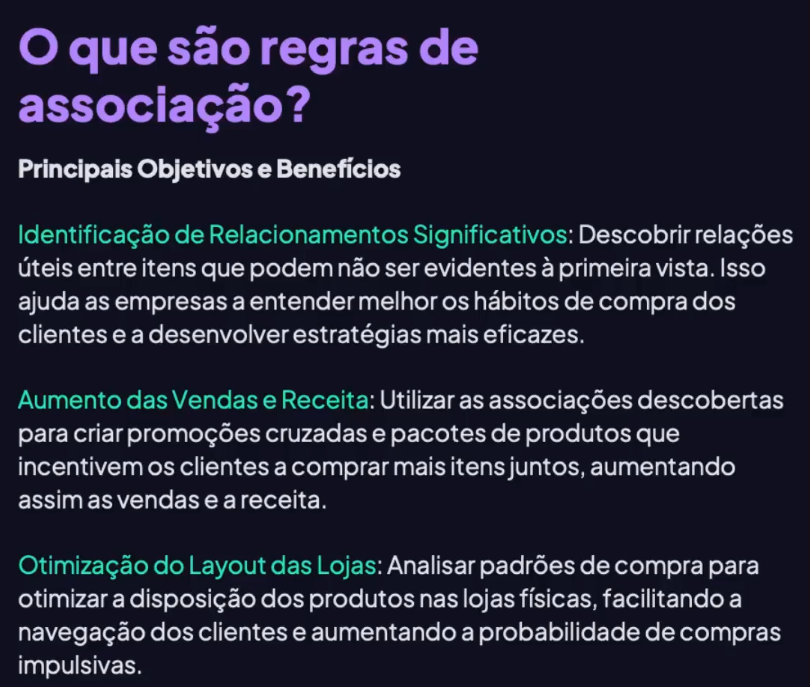

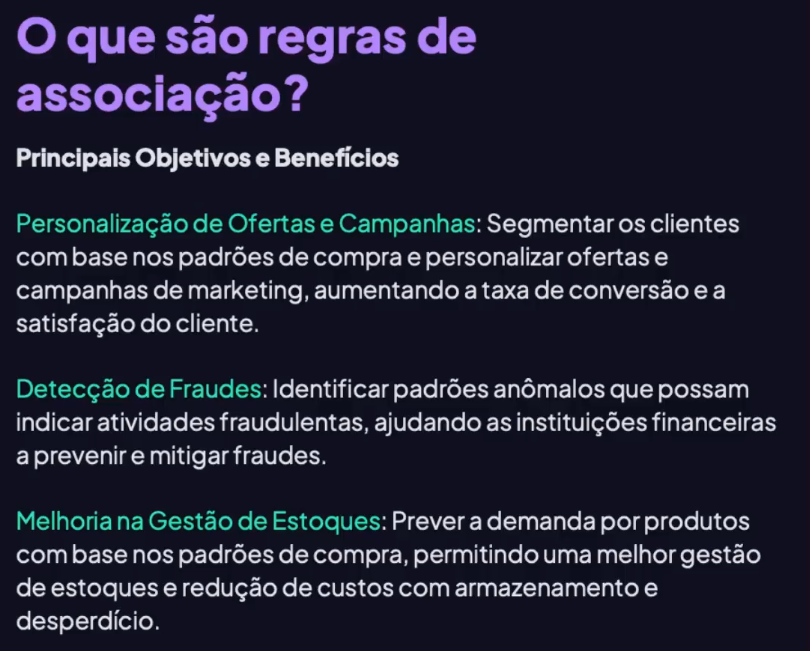

### Casos de uso

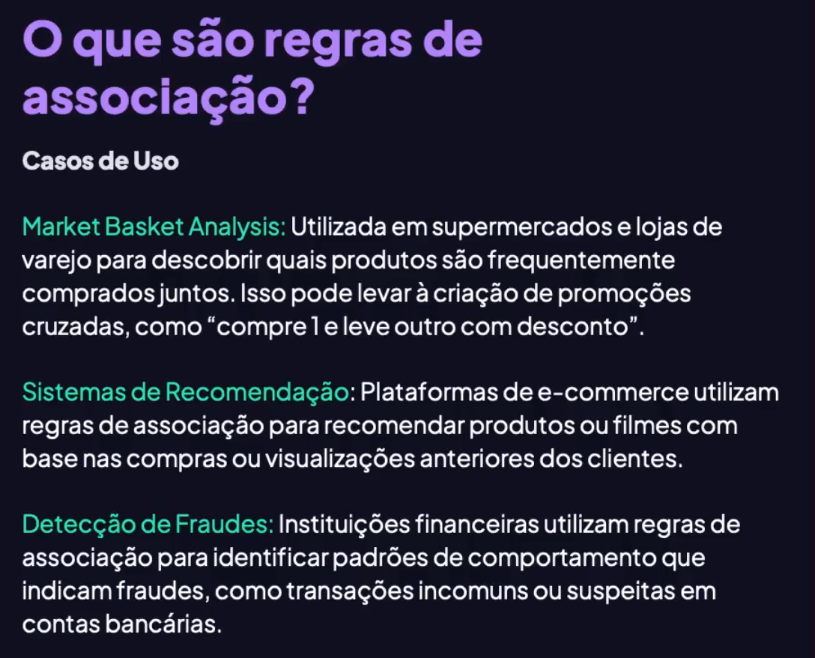

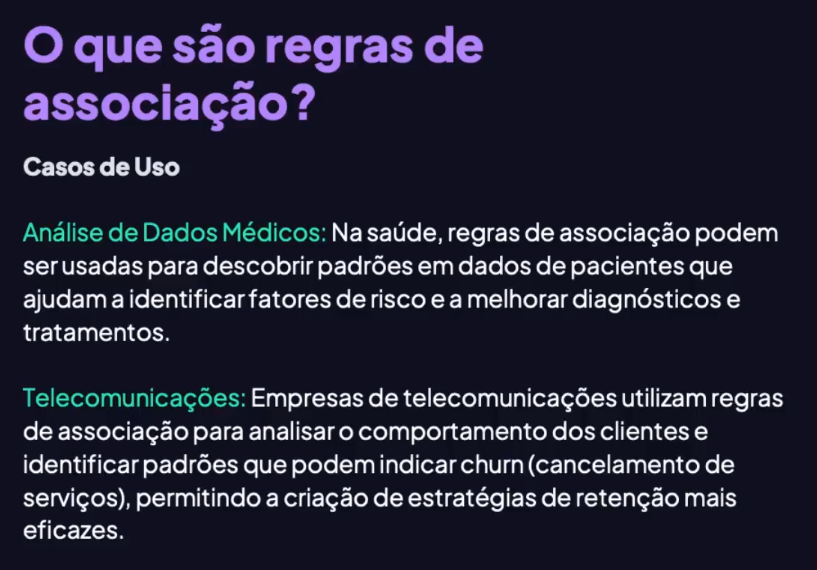

### Algoritmos

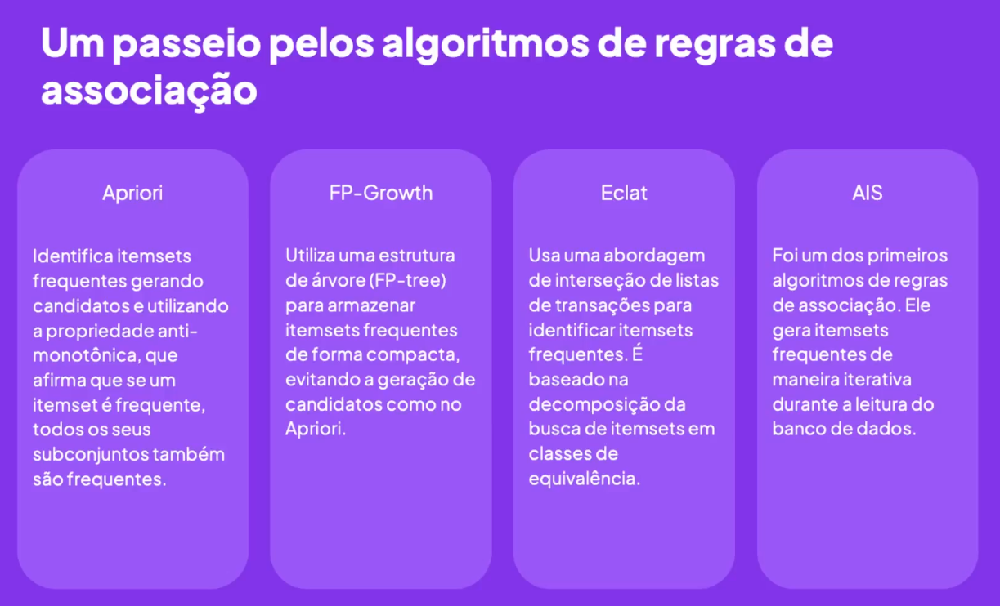

### O que é Apriori?

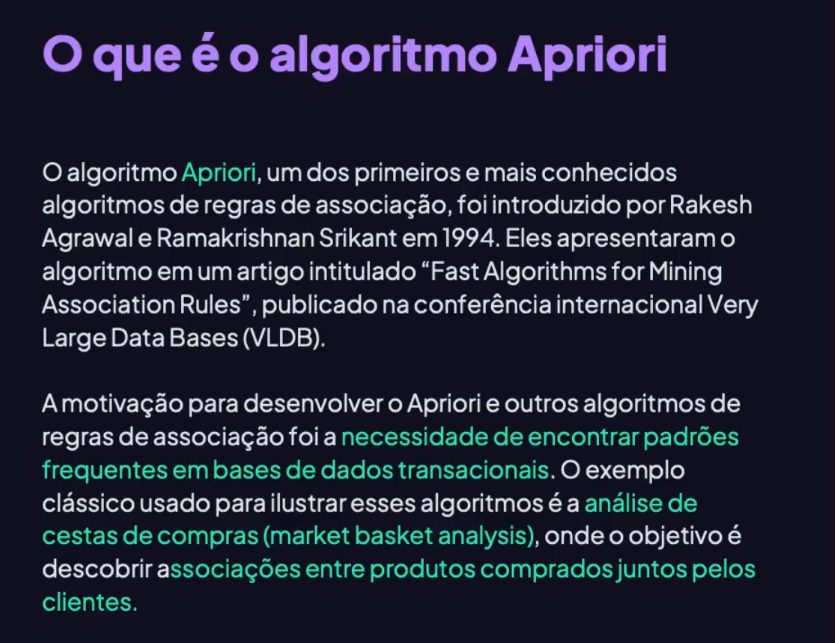

### Como funciona?

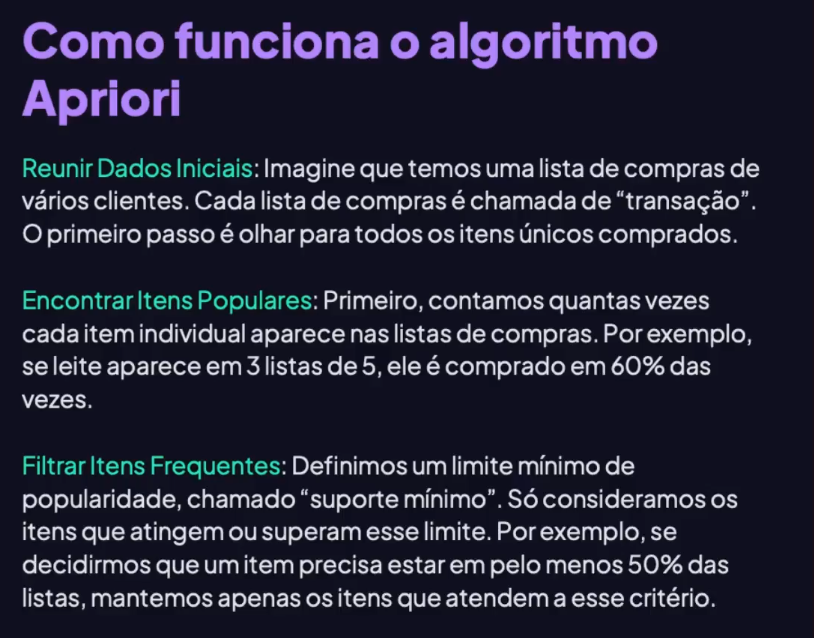

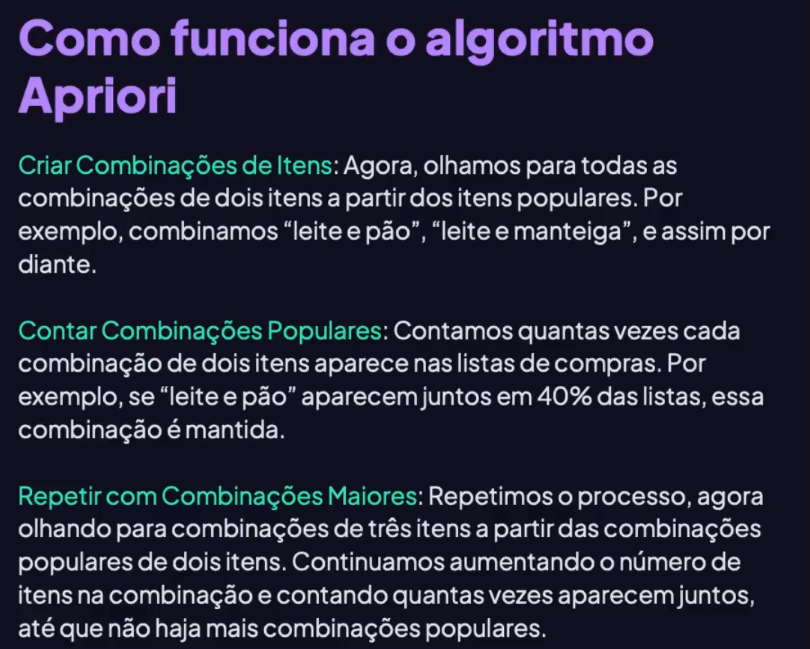

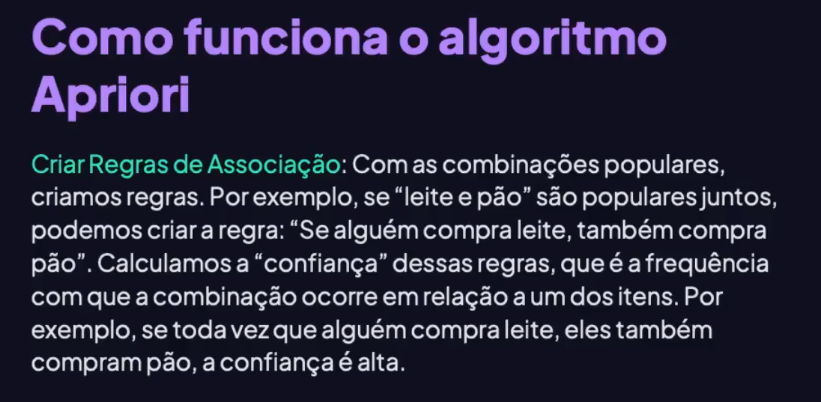

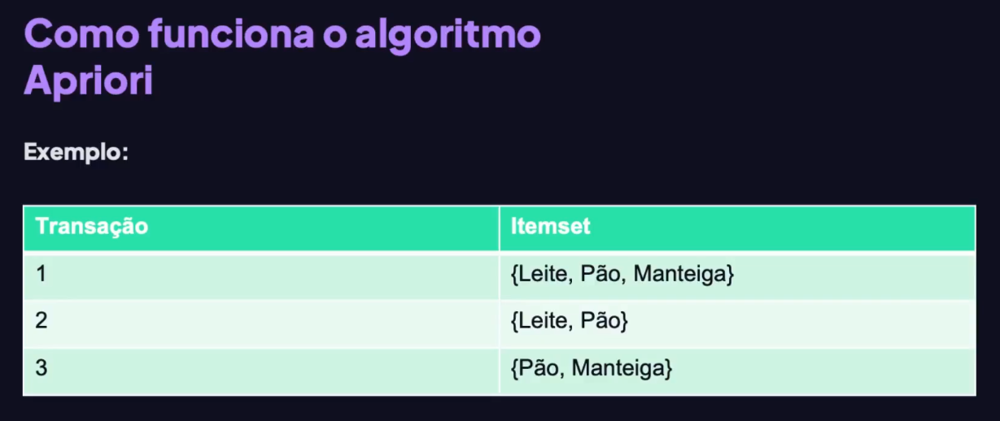

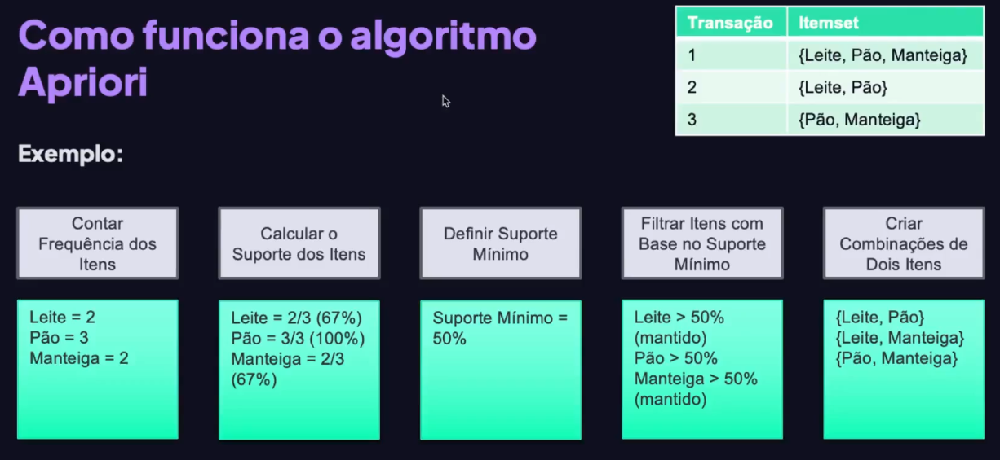

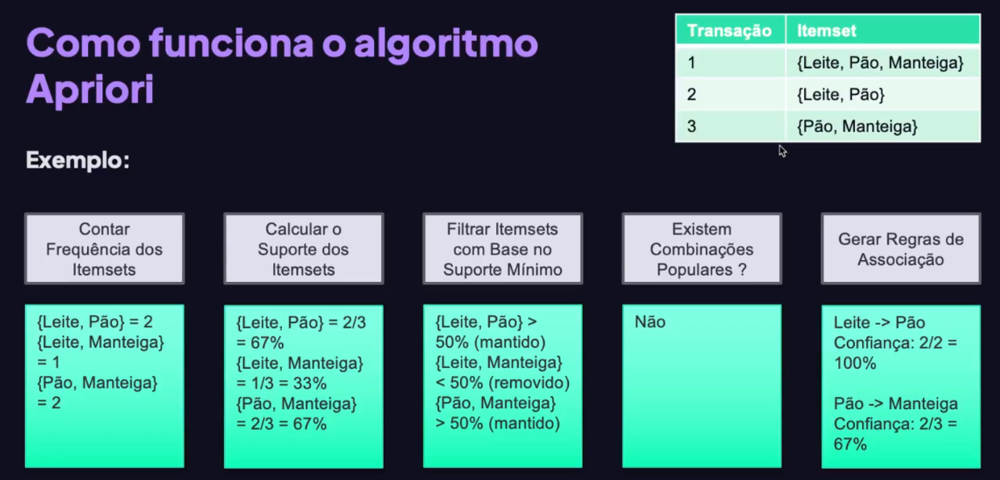

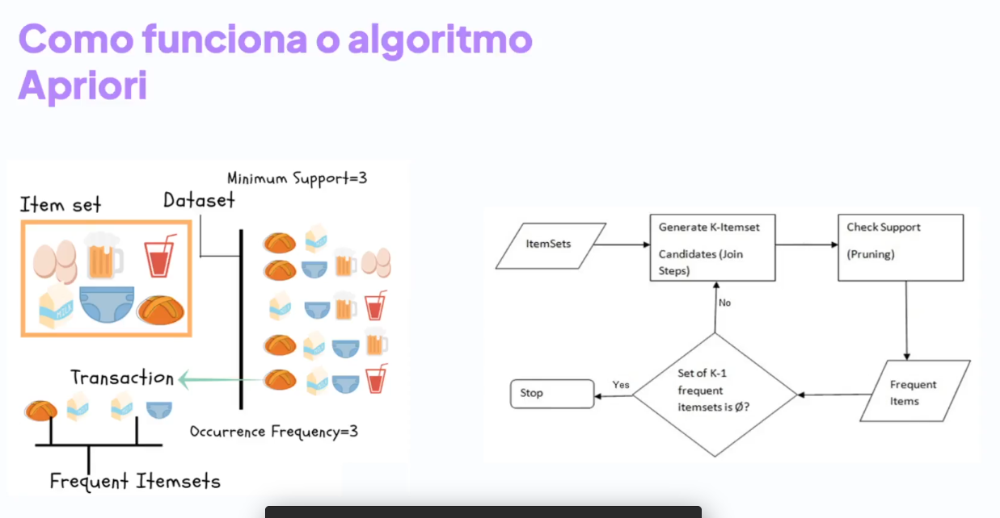

### Métricas do algoritmo

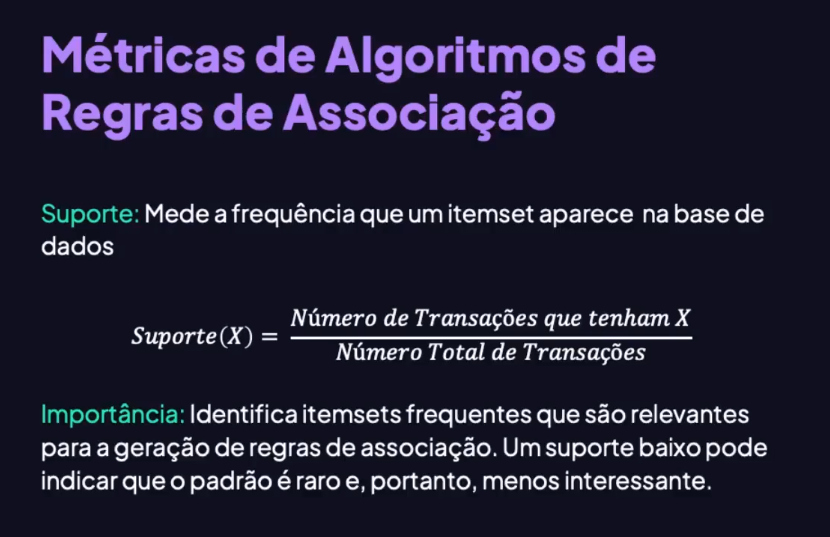

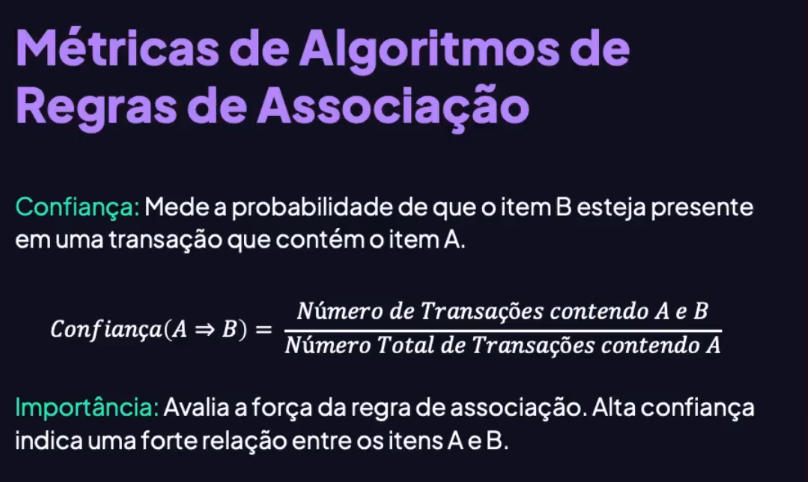

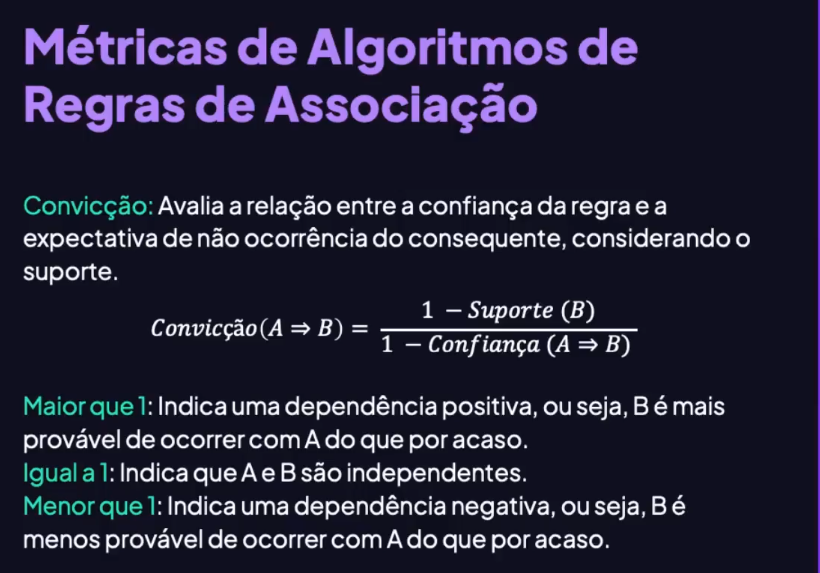

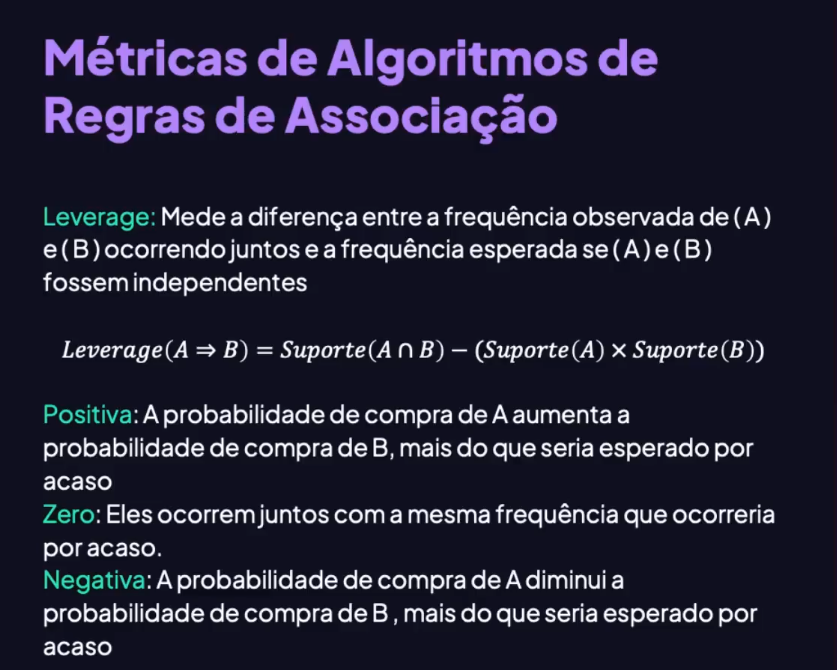

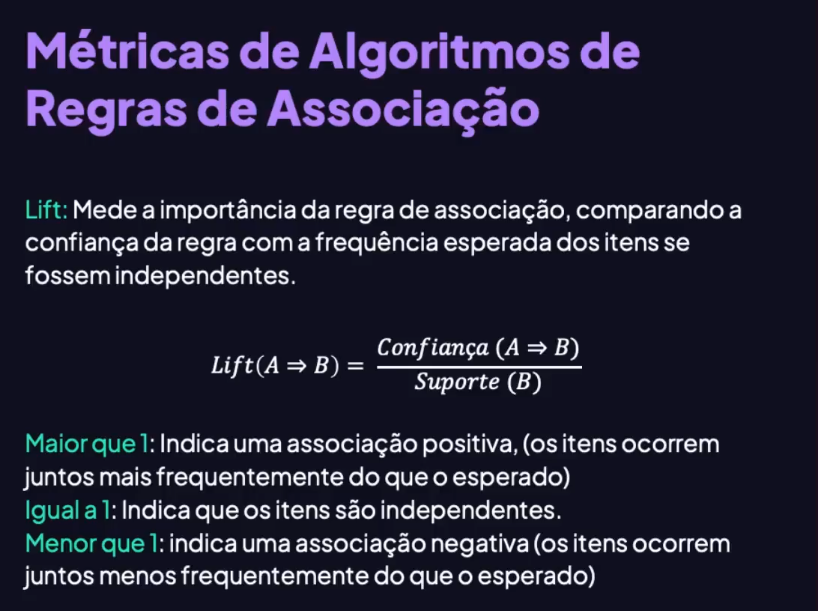

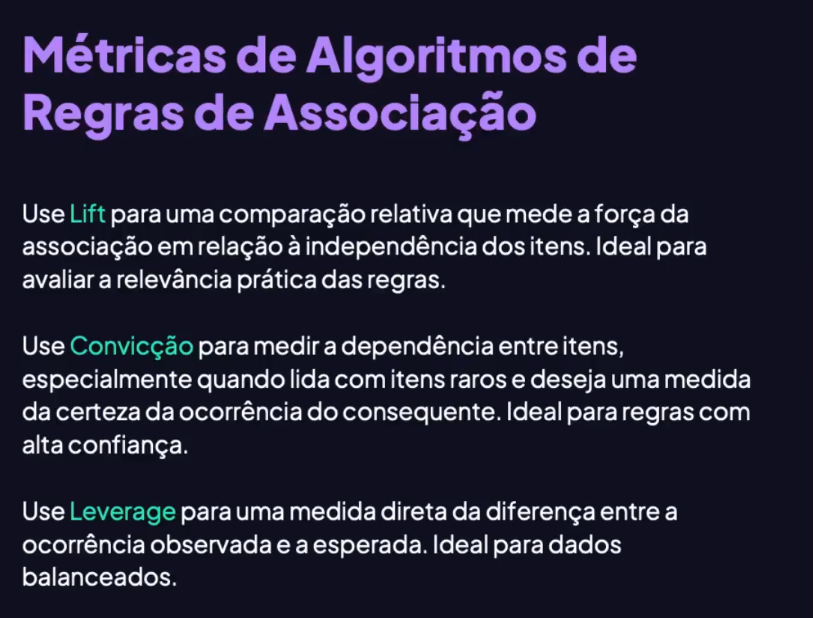

## Projeto

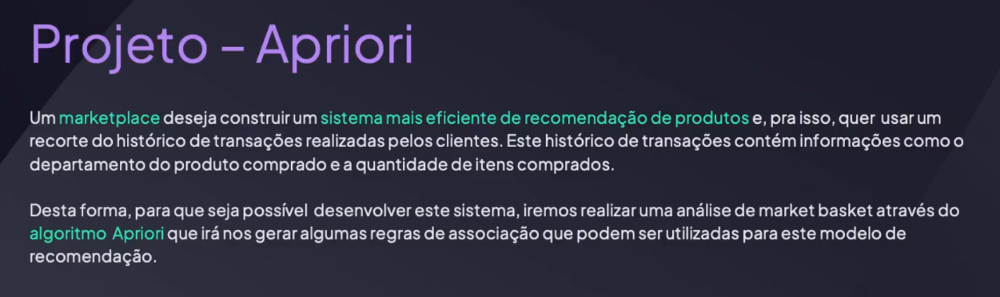

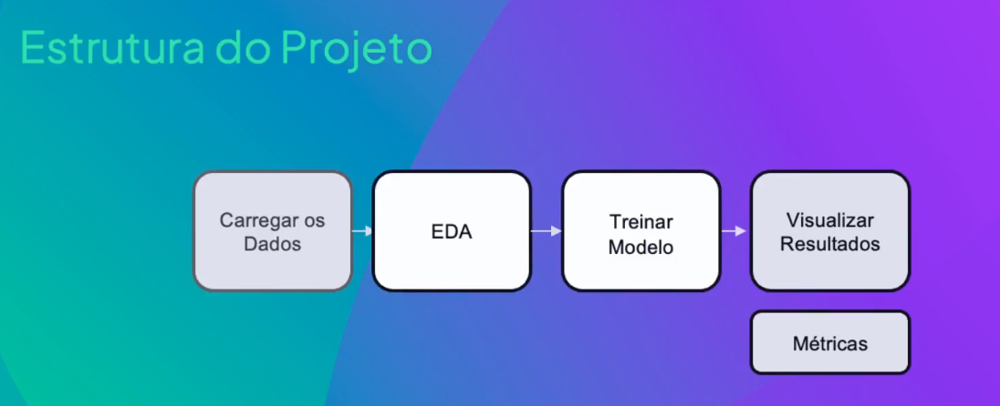

## Importações

`pipenv install pandas plotly mlxtend matplotlib ipywidgets ipykernel seaborn nbformat -d --python 3.12`

In [1]:
# EDA
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from plotly.subplots import make_subplots

# ML
from mlxtend.frequent_patterns import apriori, association_rules

## Carga de dados

In [2]:
# Carregar os dados de transações do dataset
df_transactions = pd.read_csv('./dataset/transactions_by_dept.csv')

In [3]:
# Exibir a estrutura do dataset
df_transactions.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4539 entries, 0 to 4538
Data columns (total 4 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   POS Txn  4539 non-null   uint64
 1   Dept     4539 non-null   object
 2   ID       4539 non-null   int64 
 3   Sales U  4539 non-null   int64 
dtypes: int64(2), object(1), uint64(1)
memory usage: 142.0+ KB


In [4]:
# Exibir as primeiras linhas do dataset
df_transactions.head(10)

,POS Txn,Dept,ID,Sales U
0,16120100160021008773,0261:HOSIERY,250,2
1,16120100160021008773,0634:VITAMINS & HLTH AIDS,102,1
2,16120100160021008773,0879:PET SUPPLIES,158,2
3,16120100160021008773,0973:CANDY,175,2
4,16120100160021008773,0982:SPIRITS,176,1
5,16120100160021008773,0983:WINE,177,4
6,16120100160021008773,0991:TOBACCO,179,2
7,16120100160021008774,0597:HEALTH AIDS,93,1
8,16120100160021008774,0604:PERSONAL CARE,100,5
9,16120100160021008775,0819:PRE-RECORDED A/V,135,1


In [5]:
# Exibir as últimas linhas do dataset
df_transactions.tail(5)

,POS Txn,Dept,ID,Sales U
4534,16120100160162000843,0857:PC PERIPH/OFFICE ACC,155,1
4535,16120100160162000845,0395:MENS ATHLETIC SHOES,49,1
4536,16120100160162000845,0815:AUDIO ELECTRONICS,132,1
4537,16120100160162000846,0532:AMERICAN GREETINGS,72,1
4538,16120100160221001467,0066:VENDING/AMUSEMENT MA,242,1


## EDA

### Tratamento inicial

In [6]:
# Exibir estatísticas descritivas do dataset
df_transactions.describe()

,POS Txn,ID,Sales U
count,4.539000e+03,4539.000000,4539.000000
mean,1.612010e+19,137.546816,1.764265
std,3.282793e+07,67.255705,1.842388
min,1.612010e+19,1.000000,-9.000000
25%,1.612010e+19,93.000000,1.000000
50%,1.612010e+19,152.000000,1.000000
75%,1.612010e+19,176.000000,2.000000
max,1.612010e+19,311.000000,24.000000


In [8]:
# Renomear colunas
df_transactions.rename(columns={'POS Txn': 'ID_Transacao', 'Dept': 'Departamento', 'ID': 'ID_Departamento', 'Sales U': 'Qtde_Vendida'}, inplace=True)

In [19]:
df_transactions.info()

<class 'pandas.core.frame.DataFrame'>
Index: 4390 entries, 0 to 4538
Data columns (total 4 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   ID_Transacao     4390 non-null   uint64
 1   Departamento     4390 non-null   object
 2   ID_Departamento  4390 non-null   int64 
 3   Qtde_Vendida     4390 non-null   int64 
dtypes: int64(2), object(1), uint64(1)
memory usage: 171.5+ KB


### Análise dos dados

In [ ]:
# Quantidade de departamentos
df_transactions['Departamento'].nunique()

160

In [11]:
# Quantidade de id de departamentos
df_transactions['ID_Departamento'].nunique()

160

In [18]:
# Quantidade de transações
df_transactions['ID_Transacao'].nunique()

1943

In [14]:
# Um departamento pode aparecer mais de uma vez em uma transação? Resp: Não
# df_transactions.groupby(['ID_Transacao', 'ID_Departamento']).nunique().max()
(len(df_transactions.groupby(['ID_Transacao', 'ID_Departamento'])) !=  len(df_transactions))

False

In [16]:
# Checar se há quantidades de vendas negativas ou zero
len(df_transactions[df_transactions['Qtde_Vendida'] <= 0])

149

In [17]:
# Remover linhas com quantidades de vendas negativas ou zero
df_transactions = df_transactions[df_transactions['Qtde_Vendida'] > 0]

### Top 10 Departamentos Vendas

In [22]:
# Quais departamentos possuem o maior volume de transações?
transactions_by_dept = df_transactions['Departamento'].value_counts()

# Plot
fig_transactions_volume = px.bar(transactions_by_dept, color=transactions_by_dept.index, orientation='h', title='Volume de transações por departamento')
fig_transactions_volume.update_layout(showlegend=False)
fig_transactions_volume.show()

In [23]:
# Top 10 departamentos com o maior volume de transações
transactions_by_dept_top_10 = df_transactions['Departamento'].value_counts().head(10)

# Plot
fig_transactions_volume_top_10 = px.bar(transactions_by_dept_top_10, color=transactions_by_dept_top_10.index, orientation='h', title='TOP 10 Volume de transações por departamento')
fig_transactions_volume_top_10.update_layout(showlegend=False)
fig_transactions_volume_top_10.show()

In [ ]:
# Quantidade de unidades vendidas por departamento
sum_unit_sold_by_dept = df_transactions.groupby('Departamento')['Qtde_Vendida'].sum().sort_values(ascending=False)

# Plot
fig_sales_sum_by_dept = px.bar(sum_unit_sold_by_dept, color=sum_unit_sold_by_dept.index, orientation='h', title='Quantidade de vendas por departamento')
fig_sales_sum_by_dept.update_layout(showlegend=False)
fig_sales_sum_by_dept.show()

In [25]:
# Quantidade de unidades vendidas por departamento
sum_unit_sold_by_dept_top_10 = df_transactions.groupby('Departamento')['Qtde_Vendida'].sum().sort_values(ascending=False).head(10)

# Plot
fig_sales_sum_by_dept_top_10 = px.bar(sum_unit_sold_by_dept_top_10, color=sum_unit_sold_by_dept_top_10.index, orientation='h', title='Top 10 Quantidade de vendas por departamento')
fig_sales_sum_by_dept_top_10.update_layout(showlegend=False)
fig_sales_sum_by_dept_top_10.show()

In [26]:
# Unificar dois gráficos (Top10), para mostrar lado a lado

# Criar subplots
fig_1 = make_subplots(rows=1, cols=2, subplot_titles=('Volume de transações', 'Unidades vendidas'))

# Adicionar os gráficos ao subplot
for trace in fig_transactions_volume_top_10['data']:
		fig_1.add_trace(trace, row=1, col=1)

for trace in fig_sales_sum_by_dept_top_10['data']:
		fig_1.add_trace(trace, row=1, col=2)

# Atualizar o layout do subplot
fig_1.update_layout(showlegend=False, height=800, width=1000, title_text='Top 10 departamentos com maior volume de transações e unidades vendidas')

fig_1.show()

### Top 20 departamento variação vendas

In [29]:
# Quais departamentos têm a maior variação nas unidades vendidas por transação? Top 20

# Calcular o desvio padrão das unidades vendidas, agrupando por departamentos
std_unit_sold_by_dept = df_transactions.groupby('Departamento')['Qtde_Vendida'].std().sort_values(ascending=False).head(20)

# Plot
fig_std_unit_sold_by_dept = px.bar(std_unit_sold_by_dept, color=std_unit_sold_by_dept.index, orientation='h', title='Top 20 departamentos com maior variação nas unidades vendidas por transação')
fig_std_unit_sold_by_dept.update_layout(showlegend=False, height=800)
fig_std_unit_sold_by_dept.show()

### Distribuição de unidades vendidas por departamento

In [30]:
# Qual é a distribuição de unidades vendidas por departamento nas diferentes transações?

# Avaliar as medidas de posições da variável quantidade de vendas por departamento
px.box(df_transactions, x='Departamento', y='Qtde_Vendida', title='Distribuição de unidades vendidas por departamento')

### Top 20 Departamentos - Média de Unidades Vendidas

In [31]:
# Quais departamentos têm a maior variação nas unidades vendidas por transação? Top 20

# Calcular o desvio padrão das unidades vendidas, agrupando por departamentos
mean_unit_sold_by_dept = df_transactions.groupby('Departamento')['Qtde_Vendida'].mean().sort_values(ascending=False).head(20)

# Plot
fig_mean_unit_sold_by_dept = px.bar(mean_unit_sold_by_dept, color=mean_unit_sold_by_dept.index, orientation='h', title='Top 20 departamentos com maior média nas unidades vendidas')
fig_mean_unit_sold_by_dept.update_layout(showlegend=False, height=800)
fig_mean_unit_sold_by_dept.show()

In [33]:
# Unificar dois gráficos (Top20), para mostrar lado a lado

# Criar subplots
fig_2 = make_subplots(rows=1, cols=2, subplot_titles=('Desvio padrão', 'Média'))

# Adicionar os gráficos ao subplot
for trace in fig_std_unit_sold_by_dept['data']:
		fig_2.add_trace(trace, row=1, col=1)

for trace in fig_mean_unit_sold_by_dept['data']:
		fig_2.add_trace(trace, row=1, col=2)

# Atualizar o layout do subplot
fig_2.update_layout(showlegend=False, height=800, title_text='Top 20 departamentos com maior desvio padrão e média de unidades vendidas')

fig_2.show()

## Treinamento do algoritmo

### Preparação da base com Pivot Table

|ID_Trans|Produto1|Produto2|Produto3|Produto4|
|--------|--------|--------|--------|--------|
|00000001|    X   |        |    X   |        |
|00000002|    X   |    X   |    X   |        |
|00000003|        |        |    X   |    X   |

In [34]:
# Criar uma Pivot Table no Pandas com o ID_Transacao como linha e Departamento como coluna, e a soma das unidades vendidas como valor
df_transactions_pivot = df_transactions.pivot_table(
  index='ID_Transacao',
  columns='Departamento',
  values='Qtde_Vendida',
  aggfunc='sum',
)

In [38]:
# Verificar a estrutura da Pivot Table
df_transactions_pivot.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1943 entries, 16120100160021008773 to 16120100160221001467
Columns: 156 entries, 0002:BARBER RETAIL to 0999:UNSCANNED ITEMS
dtypes: bool(156)
memory usage: 311.2 KB


In [42]:
# Exibir as primeiras linhas da Pivot Table
df_transactions_pivot.head(10)

,0002:BARBER RETAIL,0009:FLORAL SERV/SUPPLIES,0012:LOCAL GIFTS/FOODS,0014:REPAIRS,0016:FINANCIAL SERVICES,0018:OTHER DIRECT SERVICE,0033:VENDING RETAIL,0056:SOUVENIR,0066:VENDING/AMUSEMENT MA,0071:BEAUTY RETAIL,...,0941:BEDDING,0961:GENERAL GROCERIES,0962:BEVERAGES,0965:PERISHABLES,0973:CANDY,0982:SPIRITS,0983:WINE,0984:BEER,0991:TOBACCO,0999:UNSCANNED ITEMS
0,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,True,True,True,False,True,False
1,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,True,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,...,False,True,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,True,False,False,False,False
5,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,True,False,False,True,False
6,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,True,True,True,False,False
7,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
8,False,False,False,False,False,False,False,False,False,False,...,False,False,False,True,True,False,True,False,False,False
9,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,True,False,False,False,False


In [37]:
# Converter os valores para Booleanos
df_transactions_pivot = df_transactions_pivot.map(lambda x: True if x > 0 else False)

In [40]:
# Remover o título Departamento do nome das colunas
df_transactions_pivot.rename_axis(None, axis=1, inplace=True)

In [41]:
# Remover a coluna ID_Transacao
df_transactions_pivot.reset_index(inplace=True)
df_transactions_pivot.drop(columns=['ID_Transacao'], axis=1, inplace=True)

### Correlação entre os departamentos

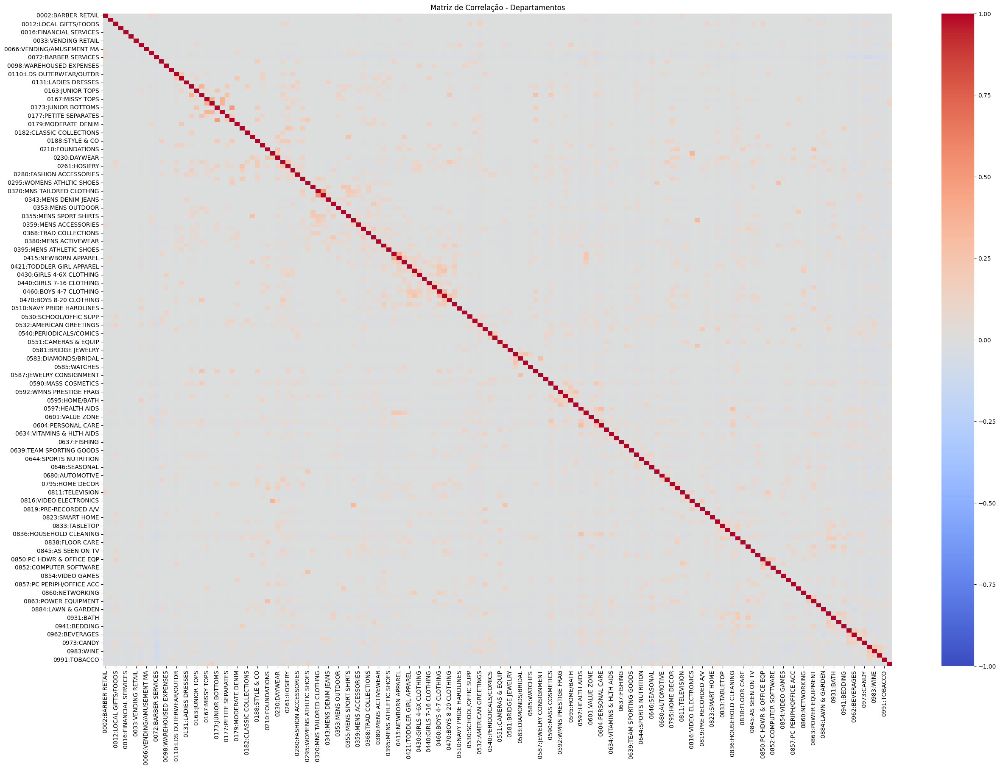

In [43]:
# Qual a correlação entre os departamentos?
association_departaments = df_transactions_pivot.corr()

plt.figure(figsize=(30, 20))
sns.heatmap(association_departaments, annot=False, cmap='coolwarm', fmt=".2f", vmin=-1, vmax=1)
plt.title('Matriz de Correlação - Departamentos')
plt.show()

### Realizar Market Basket Analisys com Apriori

In [44]:
# Obter lista de itemsets frequentes
# Como o maior departamento é o Spirits, com 314 transações, em um total de 1943 transações, o suporte máximo que podemos ter é:
# 314 / 1943 = 0.1616 => 16.16%
# Portanto, vamos definir um suporte mínimo de 2% a 5% para obter os itemsets frequentes.
# Assim teremos um cobertura adequada para análise. (40 a 100 transações)
# Diversidade de Departamentos, sem ser muito restritivo.
frequent_itemsets = apriori(df_transactions_pivot, min_support=0.02, use_colnames=True, verbose=1)

Processing 165 combinations | Sampling itemset size 3


In [45]:
# Quantos itemsets foram selecionados?
len(frequent_itemsets)

36

In [46]:
# Criar coluna para armazenar o tamanho do itemset
frequent_itemsets['length'] = frequent_itemsets['itemsets'].apply(lambda x: len(x))

In [50]:
# Quais são os itemsets mais frequentes?
frequent_itemsets.sort_values(by='support', ascending=False)

,support,itemsets,length
20,0.161606,(0982:SPIRITS),1
19,0.141534,(0973:CANDY),1
18,0.130211,(0962:BEVERAGES),1
7,0.102934,(0597:HEALTH AIDS),1
21,0.098302,(0983:WINE),1
23,0.095214,(0991:TOBACCO),1
13,0.081318,(0836:HOUSEHOLD CLEANING),1
9,0.077200,(0604:PERSONAL CARE),1
22,0.067936,(0984:BEER),1
8,0.067936,(0603:BEAUTY CARE),1


In [51]:
# Quais são os itemsets mais frequentes com mais de 1 departamento?
frequent_itemsets[frequent_itemsets['length'] > 1].sort_values(by='support', ascending=False)

,support,itemsets,length
33,0.039629,"(0982:SPIRITS, 0983:WINE)",2
31,0.034483,"(0962:BEVERAGES, 0973:CANDY)",2
25,0.032939,"(0597:HEALTH AIDS, 0604:PERSONAL CARE)",2
26,0.031395,"(0597:HEALTH AIDS, 0836:HOUSEHOLD CLEANING)",2
35,0.026763,"(0982:SPIRITS, 0991:TOBACCO)",2
34,0.025733,"(0984:BEER, 0982:SPIRITS)",2
32,0.025219,"(0962:BEVERAGES, 0982:SPIRITS)",2
27,0.023160,"(0973:CANDY, 0597:HEALTH AIDS)",2
29,0.022131,"(0962:BEVERAGES, 0961:GENERAL GROCERIES)",2
24,0.021616,"(0603:BEAUTY CARE, 0597:HEALTH AIDS)",2


In [59]:
# Validar a informação de support
# Suporte = transações onde o itemset ocorre / total de transações

transaction_spirits = len(df_transactions_pivot[df_transactions_pivot['0982:SPIRITS']== True])
total_transactions = len(df_transactions_pivot)
print(f'Suporte Spirits: {transaction_spirits / total_transactions:.2%}')

Suporte Spirits: 16.16%


### Criar regras de associação

In [67]:
# Criar regras de associação, com base nos itemsets frequentes
# Usando Confiança de 30%
# num_itemsets é 2, para obter apenas regras de associação com 2 departamentos
rules_association_confidence = association_rules(frequent_itemsets, metric="confidence", min_threshold=0.3, num_itemsets=2)
rules_association_confidence

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
0,(0603:BEAUTY CARE),(0597:HEALTH AIDS),0.067936,0.102934,0.021616,0.318182,3.091136,1.0,0.014623,1.315697,0.725803,0.144828,0.239947,0.264091
1,(0597:HEALTH AIDS),(0604:PERSONAL CARE),0.102934,0.077200,0.032939,0.320000,4.145067,1.0,0.024992,1.357059,0.845812,0.223776,0.263112,0.373333
2,(0604:PERSONAL CARE),(0597:HEALTH AIDS),0.077200,0.102934,0.032939,0.426667,4.145067,1.0,0.024992,1.564651,0.822225,0.223776,0.360880,0.373333
3,(0597:HEALTH AIDS),(0836:HOUSEHOLD CLEANING),0.102934,0.081318,0.031395,0.305000,3.750728,1.0,0.023024,1.321845,0.817537,0.205387,0.243482,0.345538
4,(0836:HOUSEHOLD CLEANING),(0597:HEALTH AIDS),0.081318,0.102934,0.031395,0.386076,3.750728,1.0,0.023024,1.461201,0.798301,0.205387,0.315631,0.345538
5,(0603:BEAUTY CARE),(0604:PERSONAL CARE),0.067936,0.077200,0.021101,0.310606,4.023384,1.0,0.015857,1.338567,0.806225,0.170124,0.252932,0.291970
6,(0961:GENERAL GROCERIES),(0962:BEVERAGES),0.050952,0.130211,0.022131,0.434343,3.335689,1.0,0.015496,1.537663,0.737805,0.139159,0.349662,0.302152
7,(0961:GENERAL GROCERIES),(0973:CANDY),0.050952,0.141534,0.020072,0.393939,2.783361,1.0,0.012861,1.416469,0.675121,0.116418,0.294019,0.267879
8,(0983:WINE),(0982:SPIRITS),0.098302,0.161606,0.039629,0.403141,2.494598,1.0,0.023743,1.404678,0.664450,0.179907,0.288093,0.324182
9,(0984:BEER),(0982:SPIRITS),0.067936,0.161606,0.025733,0.378788,2.343901,1.0,0.014755,1.349610,0.615152,0.126263,0.259045,0.269012


In [ ]:
# Criar regras de associação, com base nos itemsets frequentes
# Usando lift de 3
# num_itemsets é 2, para obter apenas regras de associação com 2 departamentos
rules_association_lift = association_rules(frequent_itemsets, metric="lift", min_threshold=3, num_itemsets=2)
rules_association_lift

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
0,(0603:BEAUTY CARE),(0597:HEALTH AIDS),0.067936,0.102934,0.021616,0.318182,3.091136,1.0,0.014623,1.315697,0.725803,0.144828,0.239947,0.264091
1,(0597:HEALTH AIDS),(0603:BEAUTY CARE),0.102934,0.067936,0.021616,0.210000,3.091136,1.0,0.014623,1.179828,0.754119,0.144828,0.152419,0.264091
2,(0597:HEALTH AIDS),(0604:PERSONAL CARE),0.102934,0.077200,0.032939,0.320000,4.145067,1.0,0.024992,1.357059,0.845812,0.223776,0.263112,0.373333
3,(0604:PERSONAL CARE),(0597:HEALTH AIDS),0.077200,0.102934,0.032939,0.426667,4.145067,1.0,0.024992,1.564651,0.822225,0.223776,0.360880,0.373333
4,(0597:HEALTH AIDS),(0836:HOUSEHOLD CLEANING),0.102934,0.081318,0.031395,0.305000,3.750728,1.0,0.023024,1.321845,0.817537,0.205387,0.243482,0.345538
5,(0836:HOUSEHOLD CLEANING),(0597:HEALTH AIDS),0.081318,0.102934,0.031395,0.386076,3.750728,1.0,0.023024,1.461201,0.798301,0.205387,0.315631,0.345538
6,(0603:BEAUTY CARE),(0604:PERSONAL CARE),0.067936,0.077200,0.021101,0.310606,4.023384,1.0,0.015857,1.338567,0.806225,0.170124,0.252932,0.291970
7,(0604:PERSONAL CARE),(0603:BEAUTY CARE),0.077200,0.067936,0.021101,0.273333,4.023384,1.0,0.015857,1.282657,0.814319,0.170124,0.220368,0.291970
8,(0962:BEVERAGES),(0961:GENERAL GROCERIES),0.130211,0.050952,0.022131,0.169960,3.335689,1.0,0.015496,1.143377,0.805036,0.139159,0.125398,0.302152
9,(0961:GENERAL GROCERIES),(0962:BEVERAGES),0.050952,0.130211,0.022131,0.434343,3.335689,1.0,0.015496,1.537663,0.737805,0.139159,0.349662,0.302152


In [69]:
# Criar regras de associação, com base nos itemsets frequentes
# Usando conviction de 1.4
# num_itemsets é 2, para obter apenas regras de associação com 2 departamentos
rules_association_conviction = association_rules(frequent_itemsets, metric="conviction", min_threshold=1.4, num_itemsets=2)
rules_association_conviction

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
0,(0604:PERSONAL CARE),(0597:HEALTH AIDS),0.077200,0.102934,0.032939,0.426667,4.145067,1.0,0.024992,1.564651,0.822225,0.223776,0.360880,0.373333
1,(0836:HOUSEHOLD CLEANING),(0597:HEALTH AIDS),0.081318,0.102934,0.031395,0.386076,3.750728,1.0,0.023024,1.461201,0.798301,0.205387,0.315631,0.345538
2,(0961:GENERAL GROCERIES),(0962:BEVERAGES),0.050952,0.130211,0.022131,0.434343,3.335689,1.0,0.015496,1.537663,0.737805,0.139159,0.349662,0.302152
3,(0961:GENERAL GROCERIES),(0973:CANDY),0.050952,0.141534,0.020072,0.393939,2.783361,1.0,0.012861,1.416469,0.675121,0.116418,0.294019,0.267879
4,(0983:WINE),(0982:SPIRITS),0.098302,0.161606,0.039629,0.403141,2.494598,1.0,0.023743,1.404678,0.664450,0.179907,0.288093,0.324182
